In [1]:
import osmnx as ox
import os
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import geopandas as gpd
from shapely import wkt
from shapely.geometry import Point, MultiPolygon
import unicodedata
import networkx as nx


In [2]:


def verificar_e_carregar_grafo(nome_cidade, caminho_arquivo):
    
    # Verifica se o arquivo já existe
    if os.path.exists(caminho_arquivo):
        print(f"Carregando o grafo de '{nome_cidade}' a partir do arquivo '{caminho_arquivo}'.")
        G = ox.load_graphml("./"+caminho_arquivo)
    else:
        print(f"Arquivo '{caminho_arquivo}' não encontrado. Baixando dados e criando o grafo para '{nome_cidade}'.")
        # Baixa os dados da cidade especificada e cria o grafo
        G = ox.graph_from_place(nome_cidade, network_type='drive')
        # Salva o grafo em um arquivo para uso futuro
        ox.save_graph_geopackage(G, 'fortaleza_graph_shapefile')
        ox.save_graphml(G, caminho_arquivo)
    return G

# Definindo o nome da cidade e o caminho do arquivo
nome_cidade = "Fortaleza, Ceará, Brazil"
caminho_arquivo = "input/fortaleza.graphml"

# Chama a função para verificar e carregar (ou criar) o grafo
G = verificar_e_carregar_grafo(nome_cidade, caminho_arquivo)


Carregando o grafo de 'Fortaleza, Ceará, Brazil' a partir do arquivo 'input/fortaleza.graphml'.


In [3]:
bairros = pd.read_csv('./input/Bairros_de_Fortaleza.csv')
bairros['multipolygon'] = bairros['The_geom'].apply(wkt.loads)
bairros = gpd.GeoDataFrame(bairros, geometry='multipolygon')
bairros.crs = "EPSG:4326"

In [4]:
def remover_acentos(texto):
    # Normalizar para a forma NFD (Normalização Forma D: Canonical Decomposition)
    texto_normalizado = unicodedata.normalize('NFD', texto)
    
    # Filtrar para manter apenas caracteres base (removendo os acentos)
    texto_sem_acento = ''.join(c for c in texto_normalizado if unicodedata.category(c) != 'Mn')
    
    return texto_sem_acento

In [5]:

var = []
nos = G.nodes()
for id,bairro,shapefile in zip(bairros['id'],bairros['Nome'],bairros['multipolygon']):
    pontos_dentro = []
    edges = []
    map = {}
    n = 0
    for no in nos:
        ponto_obj = Point(G.nodes()[no]['x'],G.nodes()[no]['y'])
        
        # Verifica se o ponto está dentro do MultiPolygon
        if shapefile.contains(ponto_obj):
            pontos_dentro.append(no)
            map[no] = n
            n += 1
    for no in pontos_dentro:
        vizinhos = [i for i in list(G.neighbors(no)) if(i in pontos_dentro)]
        for vizinho in vizinhos:
            if(not G[no][vizinho][0]['oneway']):
                edges.append([map[vizinho],map[no],300,G[no][vizinho][0]['length']/300])
            edges.append([map[no],map[vizinho],300,G[no][vizinho][0]['length']/300])
    edges = np.array(edges)
    Grafo = nx.DiGraph()

    for no1,no2,peso_1,peso_2 in edges:
        Grafo.add_edge(no1, no2, weights={'peso1': peso_1, 'peso2': peso_2})
    N = len(Grafo.nodes())
    # Calcular os componentes conectados
    load = True
    while(True):
        done = True
        clusters = list(nx.strongly_connected_components(Grafo))
        # Encontrar o maior cluster
        try:
            maior_cluster = max(clusters, key=len)
        except:
            load = False
            break
        # Remover o maior cluster do grafo
        for node in list(Grafo.nodes()):
            if(node not in maior_cluster):
                done =  done & False
                Grafo.remove_node(node)
        
        mapeamento = {v: i for i, v in enumerate(Grafo.nodes())}
        Grafo = nx.relabel_nodes(Grafo, mapeamento)
    
        grau_entrada = Grafo.in_degree()

        # Identifique os vértices com grau de entrada zero
        vertices_grau_zero = [v for v, d in grau_entrada if d < 1]
        if(len(vertices_grau_zero) != 0):
            done =  done & False
        
        # Remova os vértices com grau de entrada zero
        Grafo.remove_nodes_from(vertices_grau_zero)

        mapeamento = {v: i for i, v in enumerate(Grafo.nodes())}
        Grafo = nx.relabel_nodes(Grafo, mapeamento)
        if(done):
            break
    if(load):
        Nfinal = len(Grafo.nodes())
        edges = []
        var.append([N,Nfinal])
        for u, v, data in Grafo.edges(data=True):
            edges.append([u,v,data['weights']['peso1'],data['weights']['peso2']])
        print(bairro)
        np.savetxt(f"./BPR/file/edges_{id}.txt",edges,fmt='%d %d %.2f %.6f')

Rachel de Queiroz
José Bonifácio
Antônio Bezerra
Genibaú
Edson Queiroz
Bom Futuro
Bonsucesso
Demócrito Rocha
Dias Macedo
Itaperi
Carlito Pamplona
São Gerardo
Moura Brasil
Aldeota
Amadeu Furtado
Barra do Ceará
Benfica
Centro
Jardim Guanabara
Mucuripe
Cocó
Cristo Redentor
Conjunto Esperança
Damas
Dionísio Torres
Farias Brito
Floresta
Jardim América
Jardim Iracema
Fátima
Jacarecanga
Joaquim Távora
Meireles
Parreão
Rodolfo Teófilo
Monte Castelo
Pedras
Pirambu
Praia de Iracema
Papicu
Parque Araxá
Parquelândia
Presidente Kennedy
Cambeba
Dom Lustosa
Varjota
Cajazeiras
Jardim Cearense
Ellery
Vila Velha
Autran Nunes
Coaçu
Henrique Jorge
João XXIII
José de Alencar
Cidade dos Funcionários
Padre Andrade
Quintino Cunha
Ancuri
Barroso
Curió
Aracapé
Guararapes
Parque Manibura
Paupina
Jardim das Oliveiras
Jangurussu
Lagoa Redonda
Itaoca
Messejana
Parque Iracema
Sabiaguaba
Bom Jardim
Salinas
Canindezinho
Granja Lisboa
Bela Vista
Couto Fernandes
Granja Portugal
Maraponga
Parque Santa Rosa
Passaré
Mondub

In [24]:
var = np.array(var)

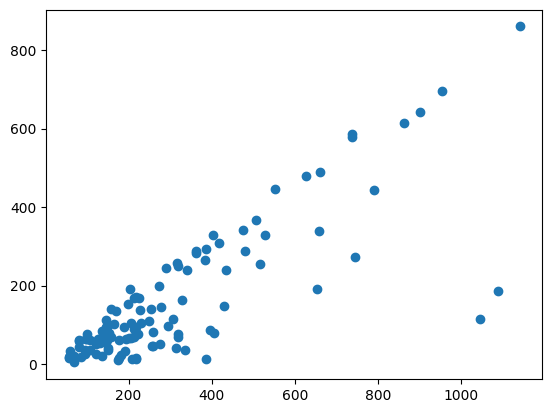

In [25]:
plt.scatter(var.T[0],var.T[1])

In [3]:
def BPR(x,d,v):
    return d/v*(1+0.2*(x/40)**10)

In [17]:
x = np.arange(0,50,0.01)
y = BPR(x,2000,10)

In [ ]:
from matplotlib import rc

rc('text', usetex=True)
rc('font', family='serif', serif='Times New Roman')

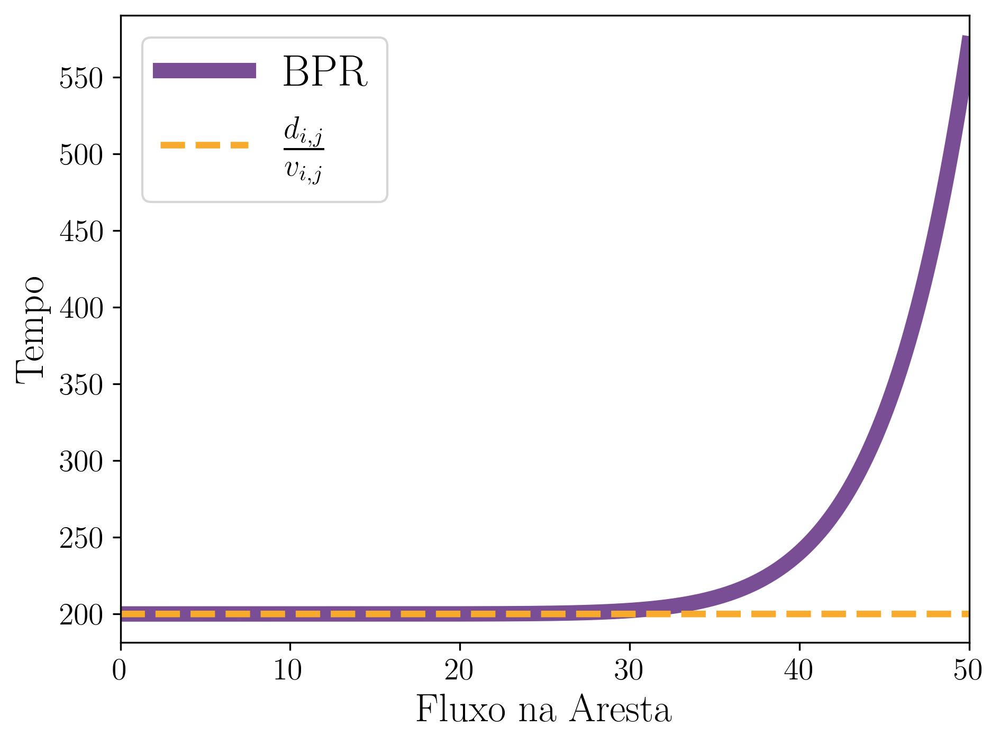

In [85]:
plt.figure(dpi = 300)

plt.plot(x,y,color = "#794e94",linewidth = 7,label = "BPR")
plt.plot(x,np.ones(len(y))*y[0],'--',color = '#F8AA2C',linewidth = 3,label = r"$\frac{d_{i,j}}{v_{i,j}}$")
plt.legend( fontsize=20)
plt.ylabel("Tempo",fontsize=18)
plt.xlabel("Fluxo na Aresta",fontsize=18)
plt.xlim(0,50)
plt.xticks(fontsize=14)  # Ticks do eixo X com fonte aumentada
plt.yticks(fontsize=14)
plt.tight_layout()
plt.savefig("./Projeto/img/BPR.png",transparent=True)
plt.show()

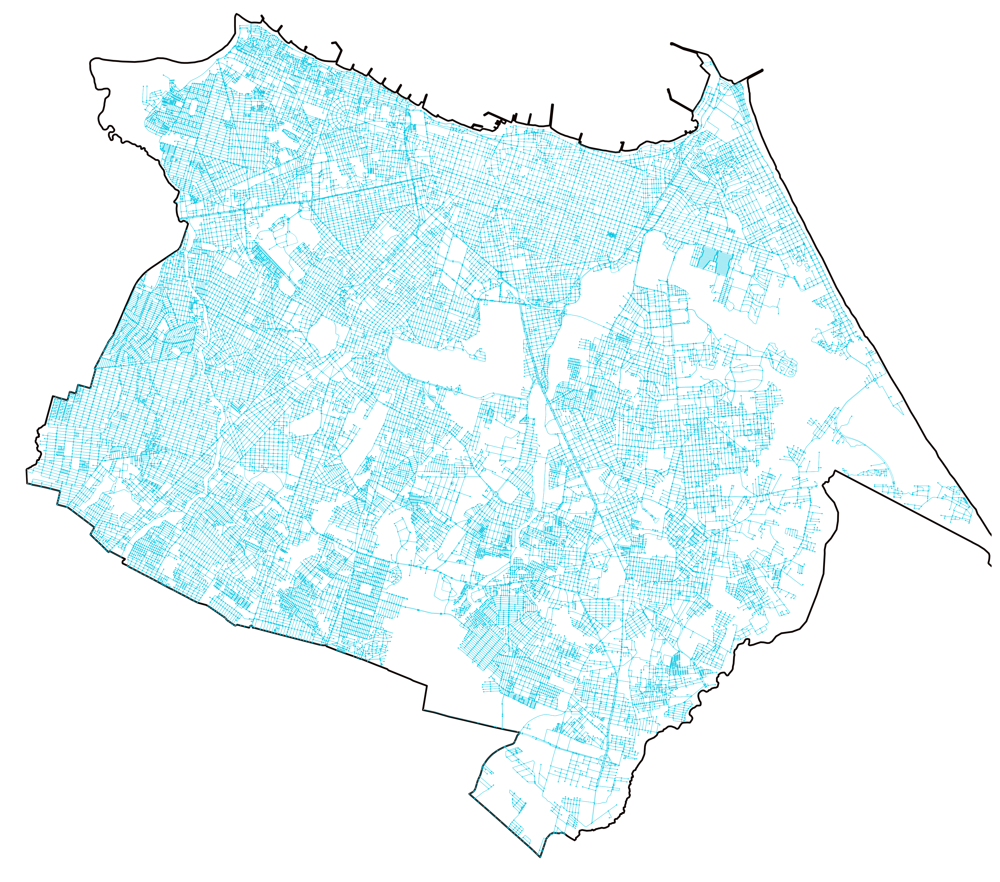

In [9]:

fortaleza_shapefile = pd.read_csv('./dados/Limite_Administrativo_da_Cidade_de_Fortaleza.csv')
fortaleza_shapefile['multipolygon'] = fortaleza_shapefile['geom'].apply(wkt.loads)
gdf_fortaleza_shapefile = gpd.GeoDataFrame(fortaleza_shapefile, geometry='multipolygon')

# Define o sistema de referência de coordenadas (CRS). Substitua 'EPSG:4326' se souber o CRS correto para seus dados
gdf_fortaleza_shapefile.crs = "EPSG:4326"
# Plota o mapa

# Desenha o grafo com vértices em vermelho e arestas em amarelo
fig, ax = plt.subplots(figsize=(12, 12),dpi = 300)
ox.plot_graph(
    G,
    ax = ax, 
    node_color='#00c5e3', 
    edge_color='#00c5e3', 
    node_size=1, 
    edge_linewidth=0.2,
    show=False, 
    close=False,
)

gdf_fortaleza_shapefile.boundary.plot(ax = ax,zorder = 0,color = '#0e0401')
plt.tight_layout()
plt.gca().set_facecolor('none')
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['bottom'].set_visible(False)
plt.gca().spines['left'].set_visible(False)
plt.savefig("./img/fortaleza.svg",transparent=True)
plt.show()

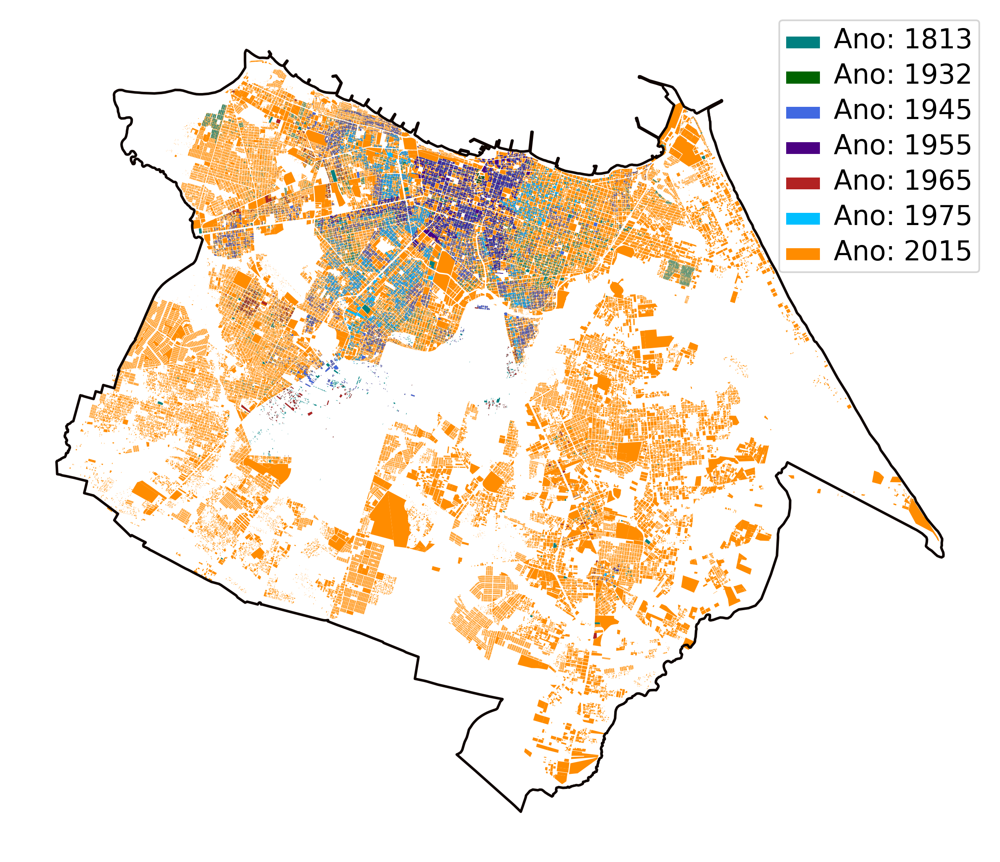

In [59]:
from matplotlib.patches import Patch

arquivos = [i for i in os.listdir("./dados/") if("Urbana" in i)]
cores = ["teal","darkgreen","royalblue","indigo","firebrick","deepskyblue","darkorange"]
fig, ax = plt.subplots(figsize=(8, 8),dpi = 300)
legenda = []
for arquivo,cor in zip(arquivos,cores):
    try:
        df = pd.read_csv('./dados/'+arquivo)
    except:
        df = pd.read_csv('./dados/'+arquivo,nrows = 266984)
    df['multipolygon'] = df['The_geom'].apply(wkt.loads)
    gdf = gpd.GeoDataFrame(df, geometry='multipolygon')
    gdf.crs = "EPSG:4326"
    ano = int(arquivo.split("_")[-1].split(".")[0])
    legenda.append(ano)
    gdf.plot(ax = ax,color = cor,zorder = abs(ano - 2015),legend=True)
legenda.sort()
legenda_items = [Patch(facecolor=cor, label=f'Ano: {i}') for cor,i in zip(cores,legenda)]
gdf_fortaleza_shapefile.boundary.plot(ax = ax,zorder = 0,color = '#0e0401')
plt.tight_layout()
legenda = ax.legend(handles=legenda_items, loc='upper right')

tamanho_fonte = 16  # Define o tamanho da fonte desejado

for texto in legenda.texts:
    texto.set_fontsize(tamanho_fonte)
ax.axis('off')
plt.gca().set_facecolor('none')
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['bottom'].set_visible(False)
plt.gca().spines['left'].set_visible(False)
plt.subplots_adjust(left=0, right=1, top=1, bottom=0)
plt.savefig("./img/urbanizacao.png",transparent=True,pad_inches=0)

plt.show()

In [18]:
df = pd.read_csv("./dados/Evolução_Urbana_2015.csv" ,usecols=[0, 1])